# Práctica 1: Sensado y análisis de audio
## Detección de bots en encuestas de opinión.

### Librerias

In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import sklearn
import librosa
import IPython.display as ipd
from pydub import AudioSegment
from IPython.display import Audio
import os
import sys
import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)

C:\Users\Antonio\AppData\Local\Temp\ipykernel_3148\1500687962.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


### Analisis explotario

#### Acerca del Dataset

Este conjunto de datos se recolecto realizandole una encuesta breve que consiste en contestar la siguiente pregunta: "relate brevemente como se siente caminando por las noches en las calles de ensenada en comparacion a hacerlo en el dia". Las respuestas fueron grabadas para posteriormente generar la misma cantidad Cuyos identificadores de archivo son:
- Genero (HOMBRE - MUJER)
- Clase (ARTIFICIAL - REAL)
- Recolector (ANDRES - ARIANA - DAFNE - JESUS - JUAN - RACHEL - SCARLETT)


In [2]:
# cargar datos
AUD = "./Audio/"
dir_list = os.listdir(AUD)
dir_list.sort()
genero = []
clase = []
source = []
path = []
for i in dir_list:
    if not i.startswith('.'):
        fname = os.listdir(AUD + i)
        for f in fname:
            part = f.split('.')[0].split('-')
            part[-1] = part[-1].split('_')[0]
            source.append(part[0])
            clase.append(part[1])
            genero.append(part[2])
            path.append(AUD + i + "/" + f)

AUD_df = pd.DataFrame({'clase':clase, 'genero':genero, 'source':source, 'path':path})
AUD_df

,clase,genero,source,path
0,ARTIFICIAL,HOMBRE,ANDRES,./Audio/Andres/ANDRES-ARTIFICIAL-HOMBRE_12.wav
1,ARTIFICIAL,HOMBRE,ANDRES,./Audio/Andres/ANDRES-ARTIFICIAL-HOMBRE_15.wav
2,ARTIFICIAL,HOMBRE,ANDRES,./Audio/Andres/ANDRES-ARTIFICIAL-HOMBRE_16.wav
3,ARTIFICIAL,HOMBRE,ANDRES,./Audio/Andres/ANDRES-ARTIFICIAL-HOMBRE_17.wav
4,ARTIFICIAL,HOMBRE,ANDRES,./Audio/Andres/ANDRES-ARTIFICIAL-HOMBRE_18.wav
...,...,...,...,...
203,REAL,MUJER,SCARLETT,./Audio/Scarlett/SCARLETT-REAL-MUJER_26.wav
204,REAL,MUJER,SCARLETT,./Audio/Scarlett/SCARLETT-REAL-MUJER_27.wav
205,REAL,MUJER,SCARLETT,./Audio/Scarlett/SCARLETT-REAL-MUJER_28.wav
206,REAL,MUJER,SCARLETT,./Audio/Scarlett/SCARLETT-REAL-MUJER_29.wav


In [14]:
AUD_df.clase.value_counts()

clase
ARTIFICIAL    104
REAL          104
Name: count, dtype: int64

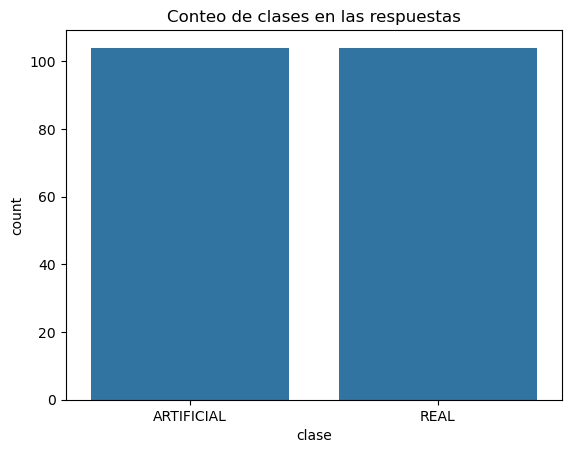

In [15]:
sns.countplot(AUD_df, x='clase')
plt.title("Conteo de clases en las respuestas")
plt.show()

In [16]:
AUD_df.genero.value_counts()

genero
MUJER     110
HOMBRE     98
Name: count, dtype: int64

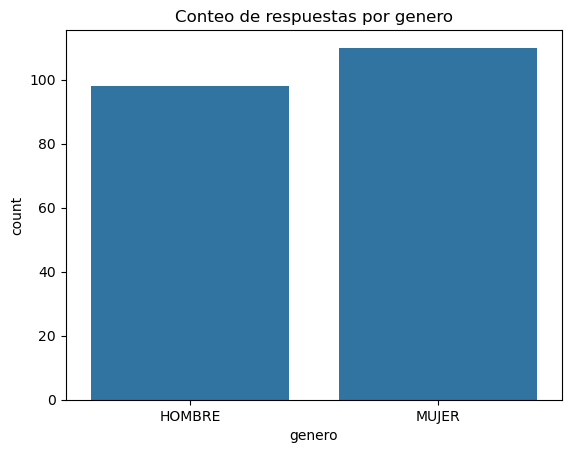

In [17]:
sns.countplot(AUD_df, x='genero')
plt.title('Conteo de respuestas por genero')
plt.show()

In [18]:
AUD_df.source.value_counts()


source
JESUS       56
JUAN        46
SCARLETT    30
ANDRES      20
DAFNE       20
RACHEL      20
ARIANA      16
Name: count, dtype: int64

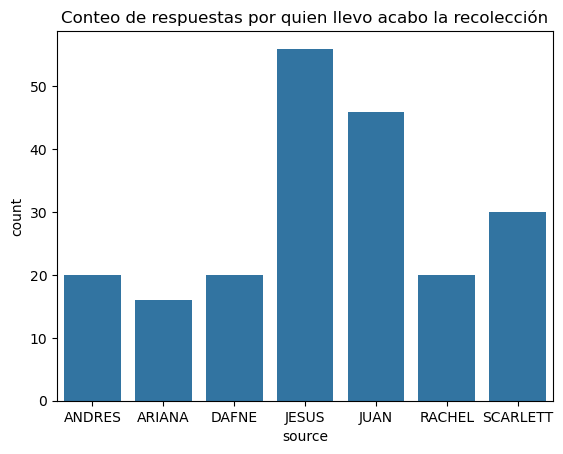

In [19]:
sns.countplot(AUD_df, x='source')
plt.title('Conteo de respuestas por quien llevo acabo la recolección')
plt.show()

In [20]:
def generar_muestra(dataframe, clase, genero, n=3):
    muestra = dataframe[(dataframe['clase'] == clase) & (dataframe['genero'] == genero)]
    muestra = muestra.sample(n=n)
    return muestra

sample_artificial_HOMBRE = generar_muestra(AUD_df, 'ARTIFICIAL', 'HOMBRE')
sample_artificial_MUJER = generar_muestra(AUD_df, 'ARTIFICIAL', 'MUJER')
sample_artificial = pd.concat([sample_artificial_HOMBRE, sample_artificial_MUJER])

sample_real_HOMBRE = generar_muestra(AUD_df, 'REAL', 'HOMBRE')
sample_real_MUJER = generar_muestra(AUD_df, 'REAL', 'MUJER')
sample_real = pd.concat([sample_real_HOMBRE, sample_real_MUJER])

sample_real

,clase,genero,source,path
93,REAL,HOMBRE,JESUS,./Audio/Jesus/JESUS-REAL-HOMBRE_09.wav
48,REAL,HOMBRE,DAFNE,./Audio/Dafne/DAFNE-REAL-HOMBRE_10.wav
137,REAL,HOMBRE,JUAN,./Audio/Juan/JUAN-REAL-HOMBRE_11.wav
35,REAL,MUJER,ARIANA,./Audio/Ariana/ARIANA-REAL-MUJER_07.wav
203,REAL,MUJER,SCARLETT,./Audio/Scarlett/SCARLETT-REAL-MUJER_26.wav
206,REAL,MUJER,SCARLETT,./Audio/Scarlett/SCARLETT-REAL-MUJER_29.wav


In [21]:
sample_artificial

,clase,genero,source,path
158,ARTIFICIAL,HOMBRE,RACHEL,./Audio/Rachel/RACHEL-ARTIFICIAL-HOMBRE_16.wav
1,ARTIFICIAL,HOMBRE,ANDRES,./Audio/Andres/ANDRES-ARTIFICIAL-HOMBRE_15.wav
4,ARTIFICIAL,HOMBRE,ANDRES,./Audio/Andres/ANDRES-ARTIFICIAL-HOMBRE_18.wav
187,ARTIFICIAL,MUJER,SCARLETT,./Audio/Scarlett/SCARLETT-ARTIFICIAL-MUJER_10.wav
186,ARTIFICIAL,MUJER,SCARLETT,./Audio/Scarlett/SCARLETT-ARTIFICIAL-MUJER_09.wav
129,ARTIFICIAL,MUJER,JUAN,./Audio/Juan/JUAN-ARTIFICIAL-MUJER_16.wav


In [22]:
samples = pd.concat([sample_real, sample_artificial])
fig, axs = plt.subplots(len(samples['clase']), 1, figsize=(16, 20))
for i, (clase, genero, source, path) in enumerate(zip(samples['clase'], samples['genero'], samples['source'], samples['path'])):
    data, sr = librosa.load(path=path)
    axs[i].plot(np.arange(0, len(data)) / sr, data)
    axs[i].set_title(f'Clase: {clase}, Género: {genero}')
    axs[i].set_xlabel('Tiempo (s)')
    axs[i].set_ylabel('Amplitud')

plt.tight_layout()
plt.show()

#### Espectogramas

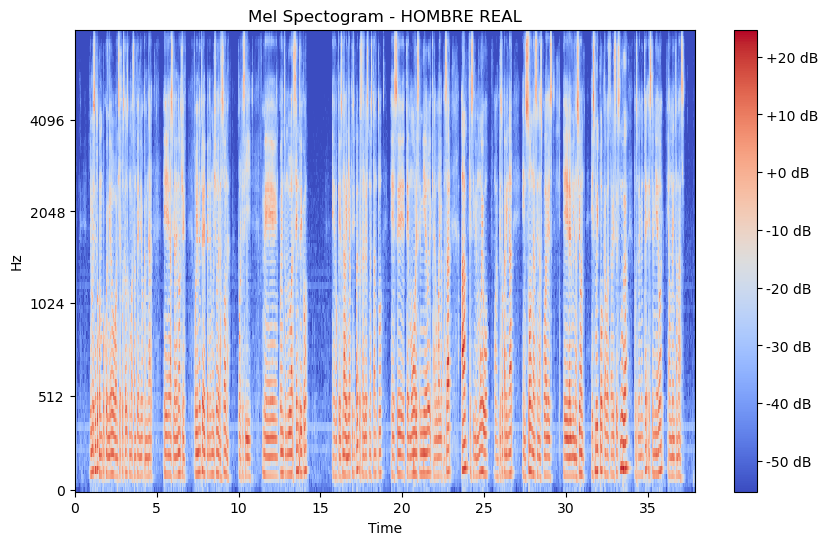

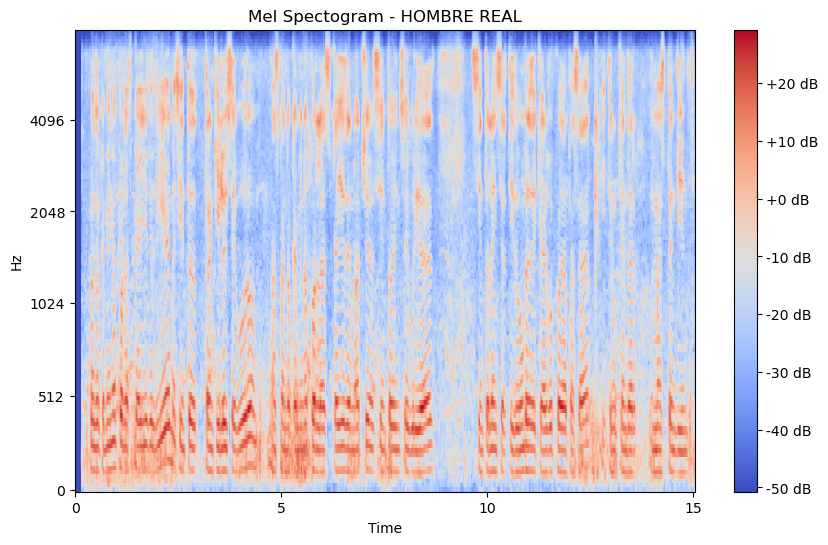

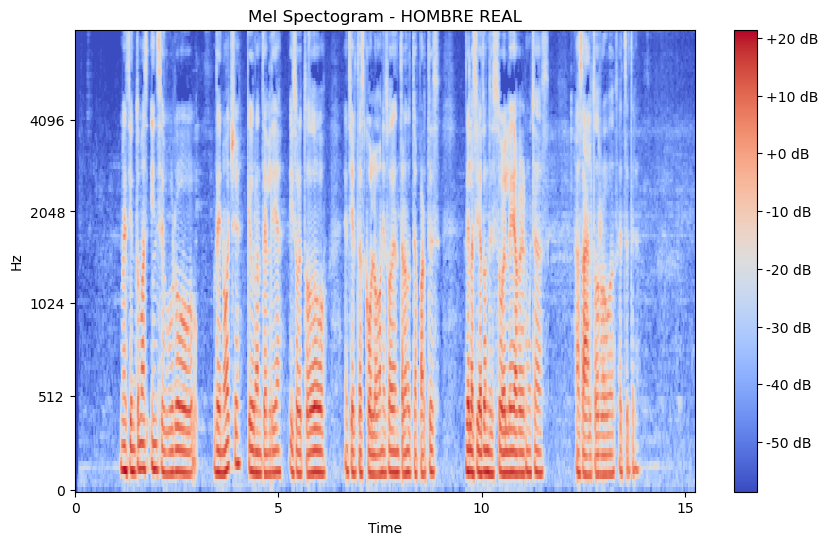

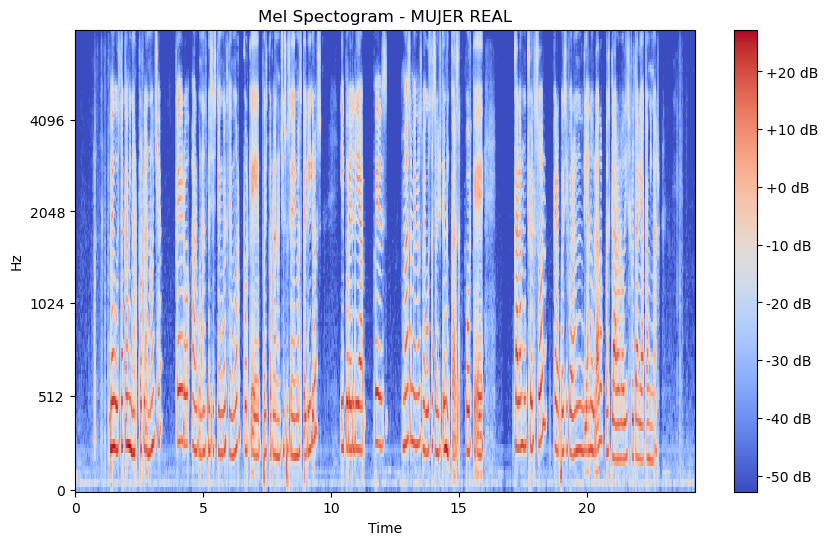

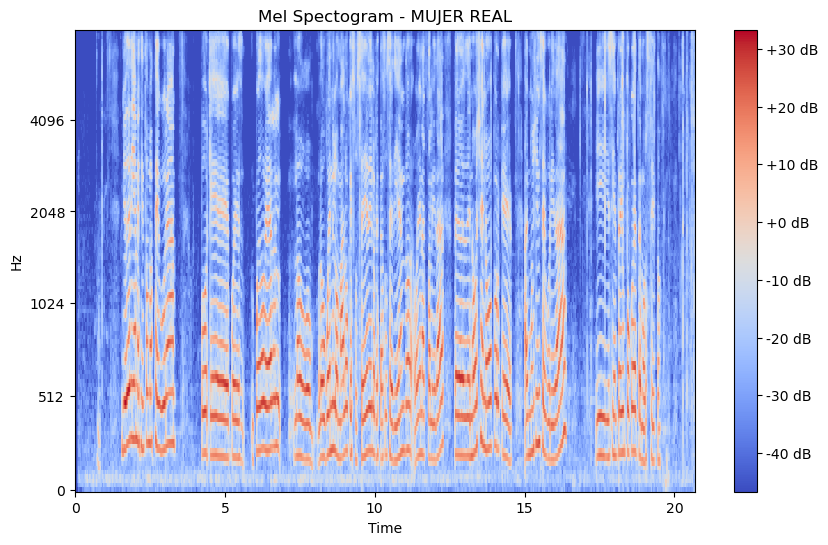

...

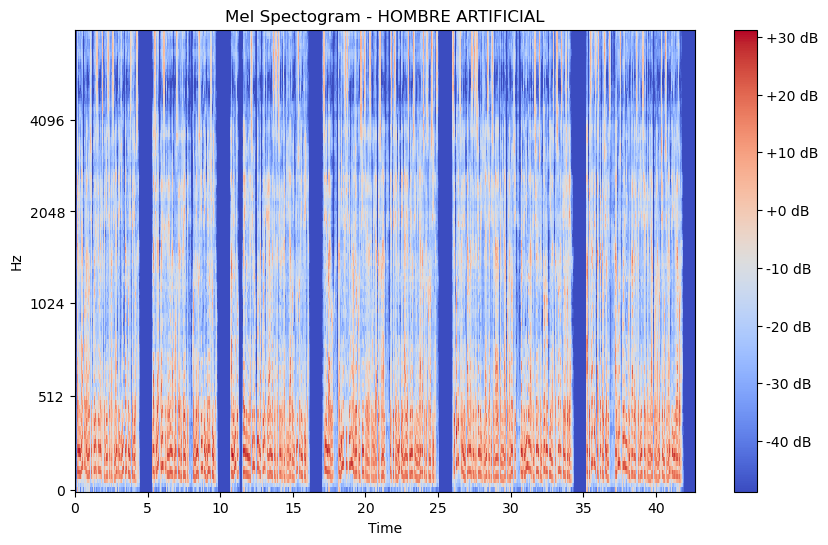

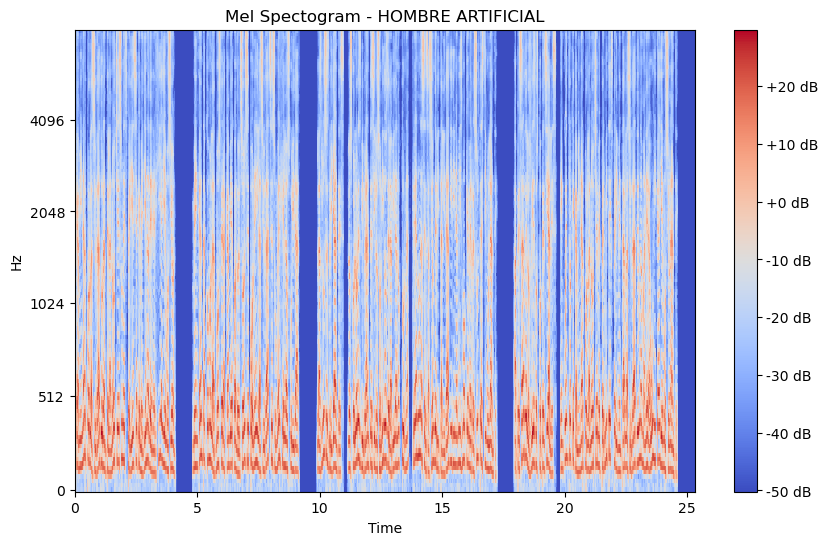

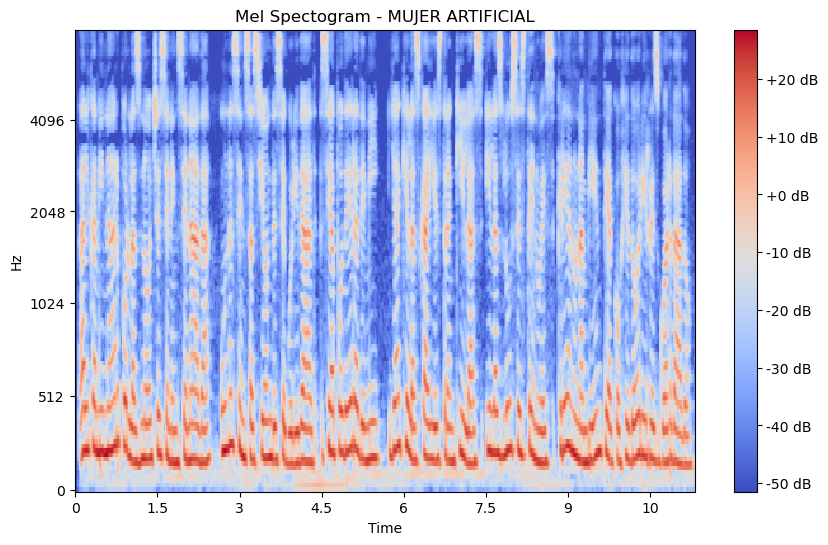

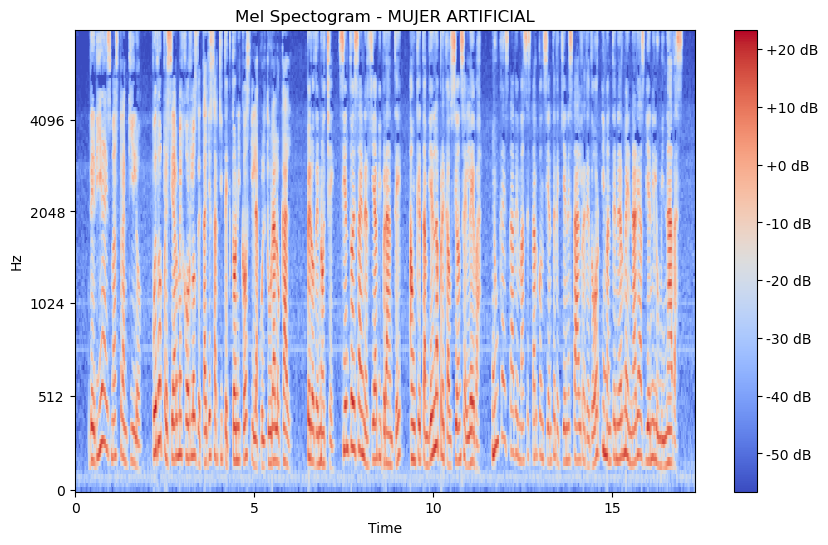

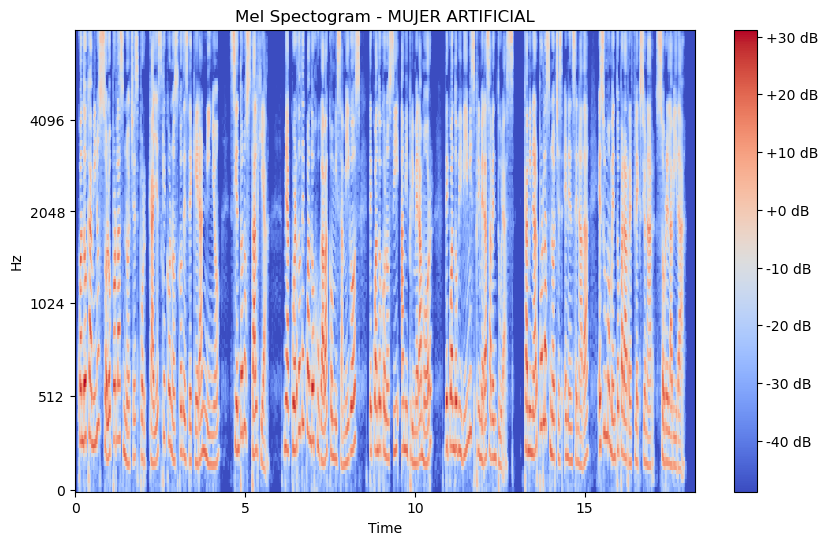

In [ ]:
for i, (clase, genero, source, path) in enumerate(zip(samples['clase'], samples['genero'], samples['source'], samples['path'])):
    data, sr = librosa.load(path=path)
    spectogram = librosa.feature.melspectrogram(y=data, sr=sr, n_mels=128, fmax=8000)
    spectogram = librosa.power_to_db(spectogram)
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(spectogram, y_axis='mel', fmax=8000, x_axis='time')
    plt.title(f'Mel Spectogram - {genero} {clase}')
    plt.colorbar(format='%+2.0f dB')

### Aumento de Datos

In [3]:
# NOISE
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data
# STRETCH
def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate=rate)
# SHIFT
def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)
# PITCH
def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=pitch_factor)

In [6]:
#audio orinigal
audio_path = './Audio/Jesus/JESUS-ARTIFICIAL-HOMBRE_28.wav'
y, sr = librosa.load(audio_path)
Audio(data=y, rate=sr)

In [ ]:
# AUDIO WITH NOISE
x = noise(y)
Audio(x, rate=sr)

In [ ]:
# STRETCHED AUDIO
x = stretch(y)
Audio(x, rate=sr)

In [ ]:
# SHIFTED AUDIO
x = shift(y)
Audio(x, rate=sr)

In [ ]:
# AUDIO WITH PITCH
x = pitch(y, sr)
Audio(x, rate=sr)

### Extracción caracteristicas

#### Obtención de la duración minima

In [4]:
duraciones = []
for path in AUD_df['path']:
    y, sr = librosa.load(path)
    duration = librosa.get_duration(y=y, sr=sr)
    duraciones.append(duration)

In [5]:
min_trim = np.min(duraciones)
print(min_trim, "segundos")

7.56 segundos


#### Extracción

In [10]:
def preprocess_and_extrac_features(y, sr): #extraccion de caracteristicas por audio
    target_samples = int(min_trim * sr)
    y = y[:target_samples]
    loudness = np.mean(librosa.amplitude_to_db(np.abs(y)))
    duration = librosa.get_duration(y=y, sr=sr)
    mfccs = np.mean(librosa.feature.mfcc(y=y, sr=sr).T, axis=0)
    spectral_energy = np.mean(librosa.feature.rms(y=y))
    zero_crossing_rate = np.mean(librosa.feature.zero_crossing_rate(y))
    spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
    spectral_bandwidth = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
    spectral_contrast = np.mean(librosa.feature.spectral_contrast(y=y, sr=sr))
    return [loudness, duration, spectral_energy, zero_crossing_rate, spectral_centroid, spectral_bandwidth, spectral_contrast] + mfccs.tolist()

In [11]:
def get_feat(path): #extraccion de caracteristicas incluyendo los audios aumentados.
    y, sr = librosa.load(path)
    x_noise = noise(y)
    x_strech = stretch(y)
    x_shift = shift(y)
    x_pitch = pitch(y, sr)
    result_original = preprocess_and_extrac_features(y, sr)
    result_noise = preprocess_and_extrac_features(x_noise, sr)
    result_strech = preprocess_and_extrac_features(x_strech, sr)
    result_shift = preprocess_and_extrac_features(x_shift, sr)
    result_pitch = preprocess_and_extrac_features(x_pitch, sr)
    return [result_original, result_noise, result_strech, result_shift, result_pitch]

In [13]:
# Crear una lista para almacenar los resultados
results_list = []

# Iterar sobre los paths y las clases
for path, clase in zip(AUD_df['path'], AUD_df['clase']):
    results = get_feat(path)
    results_with_class = [(clase, *result) for result in results]
    results_list.extend(results_with_class)

# Convertir la lista de resultados en un DataFrame
df = pd.DataFrame(results_list, columns=['Clase', 'Loudness', 'Duration', 'Spectral Energy', 'Zero Crossing Rate', 'Spectral Centroid', 'Spectral Bandwidth',
                                         'Spectral Contrast'] + ['MFCC_' + str(i) for i in range(1, 21)])

# Guardar el DataFrame en un archivo CSV
df.to_csv('resultados.csv', index=False)

In [14]:
df

,Clase,Loudness,Duration,Spectral Energy,Zero Crossing Rate,Spectral Centroid,Spectral Bandwidth,Spectral Contrast,MFCC_1,MFCC_2,...,MFCC_11,MFCC_12,MFCC_13,MFCC_14,MFCC_15,MFCC_16,MFCC_17,MFCC_18,MFCC_19,MFCC_20
0,ARTIFICIAL,-42.112400,7.56,0.076017,0.181248,2527.550176,2173.507986,21.331336,-288.747772,69.259315,...,-8.001161,-4.960345,-6.474541,-5.687600,-2.102025,-0.547989,-9.651845,-3.785056,-2.027722,-4.225730
1,ARTIFICIAL,-31.327223,7.56,0.080260,0.279605,4074.359475,3149.230463,15.261693,-150.591468,34.388209,...,-6.023780,-4.063038,-4.939146,-5.218254,-1.889104,-2.024694,-5.206112,-3.401029,-2.227745,-3.160413
2,ARTIFICIAL,-42.472004,7.56,0.051892,0.135402,2301.866768,2243.588205,22.871593,-315.173645,74.727913,...,-7.893585,-5.333572,-8.091654,-6.504158,-2.730740,-1.005302,-10.293169,-4.417870,-1.822182,-4.623673
3,ARTIFICIAL,-42.338116,7.56,0.075748,0.180338,2523.522835,2152.918685,21.352844,-291.512146,68.440544,...,-7.787717,-4.943061,-6.526587,-5.593791,-2.066967,-0.554754,-9.595600,-3.842849,-1.990632,-4.145059
4,ARTIFICIAL,-40.951244,7.56,0.054193,0.139941,2434.784088,2343.016777,23.083544,-293.661713,74.376892,...,-8.973144,-4.483385,-8.536963,-5.253723,-1.698527,-2.920436,-10.939892,-1.774304,-3.302097,-4.973323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1035,REAL,-40.277306,7.56,0.043478,0.052030,1185.697356,1659.645552,24.199184,-395.914917,126.713211,...,-8.259821,-8.334263,-1.982711,-1.625316,-1.913293,-2.748001,1.297762,-4.507313,-3.138377,-0.851530
1036,REAL,-34.477466,7.56,0.048432,0.263976,4413.430249,3404.082288,15.301075,-190.746513,24.192195,...,-6.173851,-5.580681,-3.321820,-2.258929,-1.732771,-1.658466,-1.425956,-2.557484,-3.489042,-3.641084
1037,REAL,-41.894806,7.56,0.030552,0.050819,1206.225964,1669.689471,25.122810,-418.371246,125.905243,...,-7.441065,-10.234269,-1.791673,-0.845302,-1.870508,-2.275989,1.881530,-5.081177,-3.465114,-0.268567
1038,REAL,-40.720875,7.56,0.042469,0.052352,1184.531089,1669.621429,23.943423,-396.291046,126.232254,...,-7.748575,-8.269394,-2.188999,-1.642411,-1.857839,-2.690174,1.392120,-4.368657,-3.067970,-0.703629


### Selección de caracteristicas

In [3]:
df = pd.read_csv(f"./resultados.csv")
df

,Clase,Loudness,Duration,Spectral Energy,Zero Crossing Rate,Spectral Centroid,Spectral Bandwidth,Spectral Contrast,MFCC_1,MFCC_2,...,MFCC_11,MFCC_12,MFCC_13,MFCC_14,MFCC_15,MFCC_16,MFCC_17,MFCC_18,MFCC_19,MFCC_20
0,ARTIFICIAL,-42.112400,7.56,0.076017,0.181248,2527.550176,2173.507986,21.331336,-288.747772,69.259315,...,-8.001161,-4.960345,-6.474541,-5.687600,-2.102025,-0.547989,-9.651845,-3.785056,-2.027722,-4.225730
1,ARTIFICIAL,-31.327223,7.56,0.080260,0.279605,4074.359475,3149.230463,15.261693,-150.591468,34.388209,...,-6.023780,-4.063038,-4.939146,-5.218254,-1.889104,-2.024694,-5.206112,-3.401029,-2.227745,-3.160413
2,ARTIFICIAL,-42.472004,7.56,0.051892,0.135402,2301.866768,2243.588205,22.871593,-315.173645,74.727913,...,-7.893585,-5.333572,-8.091654,-6.504158,-2.730740,-1.005302,-10.293169,-4.417870,-1.822182,-4.623673
3,ARTIFICIAL,-42.338116,7.56,0.075748,0.180338,2523.522835,2152.918685,21.352844,-291.512146,68.440544,...,-7.787717,-4.943061,-6.526587,-5.593791,-2.066967,-0.554754,-9.595600,-3.842849,-1.990632,-4.145059
4,ARTIFICIAL,-40.951244,7.56,0.054193,0.139941,2434.784088,2343.016777,23.083544,-293.661713,74.376892,...,-8.973144,-4.483385,-8.536963,-5.253723,-1.698527,-2.920436,-10.939892,-1.774304,-3.302097,-4.973323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1035,REAL,-40.277306,7.56,0.043478,0.052030,1185.697356,1659.645552,24.199184,-395.914917,126.713211,...,-8.259821,-8.334263,-1.982711,-1.625316,-1.913293,-2.748001,1.297762,-4.507313,-3.138377,-0.851530
1036,REAL,-34.477466,7.56,0.048432,0.263976,4413.430249,3404.082288,15.301075,-190.746513,24.192195,...,-6.173851,-5.580681,-3.321820,-2.258929,-1.732771,-1.658466,-1.425956,-2.557484,-3.489042,-3.641084
1037,REAL,-41.894806,7.56,0.030552,0.050819,1206.225964,1669.689471,25.122810,-418.371246,125.905243,...,-7.441065,-10.234269,-1.791673,-0.845302,-1.870508,-2.275989,1.881530,-5.081177,-3.465114,-0.268567
1038,REAL,-40.720875,7.56,0.042469,0.052352,1184.531089,1669.621429,23.943423,-396.291046,126.232254,...,-7.748575,-8.269394,-2.188999,-1.642411,-1.857839,-2.690174,1.392120,-4.368657,-3.067970,-0.703629


In [4]:
df = df.drop(['Duration'], axis=1)
X = df.iloc[:, 1:]
Y = df.iloc[:, 0]

#### Info Gain

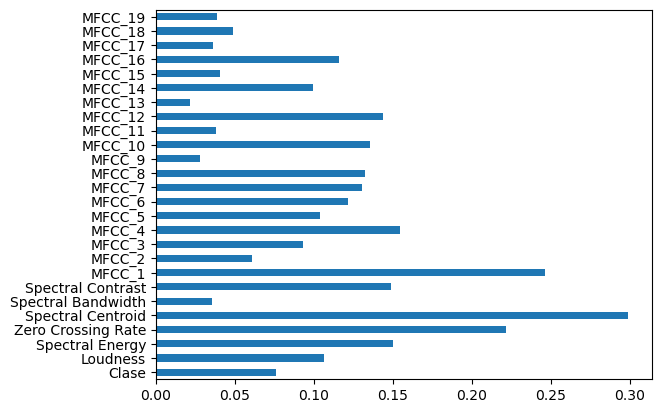

In [5]:
from sklearn.feature_selection import mutual_info_classif
import matplotlib.pyplot as plt

X_new = mutual_info_classif(X, Y)
feat_imp = pd.Series(X_new, df.columns[0:len(df.columns)-1])
feat_imp.plot(kind='barh')
plt.show()

In [6]:
# Filtrar las características con valores mayores al umbral
selected_features = df.columns[np.where(X_new > 0.13)].tolist()

# Mostrar las características seleccionadas
print("Características seleccionadas con valor mayor a", 0.13, ":", selected_features)

Características seleccionadas con valor mayor a 0.13 : ['Spectral Energy', 'Zero Crossing Rate', 'Spectral Centroid', 'Spectral Contrast', 'MFCC_1', 'MFCC_4', 'MFCC_7', 'MFCC_8', 'MFCC_10', 'MFCC_12']


#### Random Forest Importance

,Features,Importances
0,Loudness,0.013180
1,Spectral Energy,0.030613
2,Zero Crossing Rate,0.035594
3,Spectral Centroid,0.079920
4,Spectral Bandwidth,0.110373
5,Spectral Contrast,0.019307
6,MFCC_1,0.034750
7,MFCC_2,0.125611
8,MFCC_3,0.012320
9,MFCC_4,0.020561


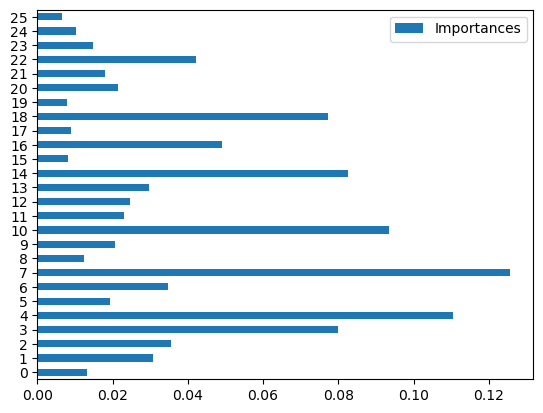

In [9]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators=340)
model.fit(X,Y)
importances = model.feature_importances_

feat_df = pd.DataFrame({"Features": pd.DataFrame(X).columns, "Importances": importances})
feat_df.set_index('Importances')
feat_df.plot.barh()
feat_df

In [11]:
# Filtrar las características con importancia mayor a 0.04
selected_features = feat_df.loc[feat_df['Importances'] > 0.04, 'Features'].tolist()

# Mostrar las características seleccionadas
print("Características seleccionadas con importancia mayor a 0.04:", selected_features)

Características seleccionadas con importancia mayor a 0.04: ['Spectral Centroid', 'Spectral Bandwidth', 'MFCC_2', 'MFCC_5', 'MFCC_9', 'MFCC_11', 'MFCC_13', 'MFCC_17']


### Entrenamiento de los modelos

#### Validación cruzada

In [22]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import f1_score, recall_score, accuracy_score, confusion_matrix, precision_score
from sklearn.model_selection import train_test_split

##### Con los features de infoGain

In [6]:
names = [
    "Nearest Neighbors",
    "Decision Tree",
    "AdaBoost",
    "Naive Bayes",
    "Linear SVM",
]
modelos = [
    KNeighborsClassifier(n_neighbors=6),
    DecisionTreeClassifier(max_depth=10),
    AdaBoostClassifier(),
    GaussianNB(),
    SVC(kernel='linear')
]

In [12]:
def validacion_cruzada(model, X, y):
    kfold = KFold(n_splits=5, shuffle=True, random_state=42)

    f1_scores = []
    sensitivities = []
    specificities = []
    accuracies = []


    for train_index, test_index in kfold.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y[train_index], y[test_index]

        model.fit(X_train, y_train)

        X_test_np = X_test.values
        
        y_pred = model.predict(X_test_np)


        f1 = f1_score(y_test, y_pred)
        f1_scores.append(f1)

        sensitivity = recall_score(y_test, y_pred)
        sensitivities.append(sensitivity)

        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        specificity = tn / (tn + fp)
        specificities.append(specificity)

        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)
        
    return np.mean(f1_scores), np.mean(sensitivities), np.mean(specificities), np.mean(accuracies)



In [18]:
X_nm = X[['Spectral Energy', 'Zero Crossing Rate', 'Spectral Centroid', 'Spectral Contrast', 'MFCC_1', 'MFCC_4', 'MFCC_7', 'MFCC_8', 'MFCC_10', 'MFCC_12']]

In [14]:
encoder = LabelEncoder()
y_encode = encoder.fit_transform(Y)

In [39]:
y_encode

array([0, 0, 0, ..., 1, 1, 1])

In [40]:
Y

0       ARTIFICIAL
1       ARTIFICIAL
2       ARTIFICIAL
3       ARTIFICIAL
4       ARTIFICIAL
           ...    
1035          REAL
1036          REAL
1037          REAL
1038          REAL
1039          REAL
Name: Clase, Length: 1040, dtype: object

In [19]:
resultados = []

for nombre, modelo in zip(names, modelos):
    f1s, sensitivity, specificity, accuracy = validacion_cruzada(model=modelo, X=X_nm, y=y_encode)
    resultados.append({"nombre": nombre, "f1_score": f1s, "sensibilidad": sensitivity, "especificidad": specificity, "precision": accuracy})

df_resultados = pd.DataFrame(resultados)

In [20]:
df_resultados

,nombre,f1_score,sensibilidad,especificidad,precision
0,Nearest Neighbors,0.800919,0.721492,0.925930,0.822115
1,Decision Tree,0.872069,0.872294,0.875896,0.873077
2,AdaBoost,0.885864,0.867959,0.912844,0.889423
3,Naive Bayes,0.810712,0.764853,0.881223,0.822115
4,Linear SVM,0.787633,0.742661,0.855118,0.800962


##### Con los features de Random Forest Importance

In [21]:
model = RandomForestClassifier(n_estimators=340)
X_nm = X[['Spectral Centroid', 'Spectral Bandwidth', 'MFCC_2', 'MFCC_5', 'MFCC_9', 'MFCC_11', 'MFCC_13', 'MFCC_17']]
f1s, sensitivity, specificity, accuracy = validacion_cruzada(model=model, X=X_nm, y=y_encode)
print("F1-score medio:", f1s)
print("Sensibilidad media:", sensitivity)
print("Especificidad media:", specificity)
print("Precisión media:", accuracy)

F1-score medio: 0.954317182540476
Sensibilidad media: 0.9447182039171113
Especificidad media: 0.9686221801305243
Precisión media: 0.9557692307692308


#### Entrenamiento del modelo definitivo

In [23]:
X_train, X_test, y_train, y_test = train_test_split(X_nm, y_encode, test_size=0.2, random_state=42)
model = RandomForestClassifier(n_estimators=340)
model.fit(X_train, y_train)

RandomForestClassifier(n_estimators=340)

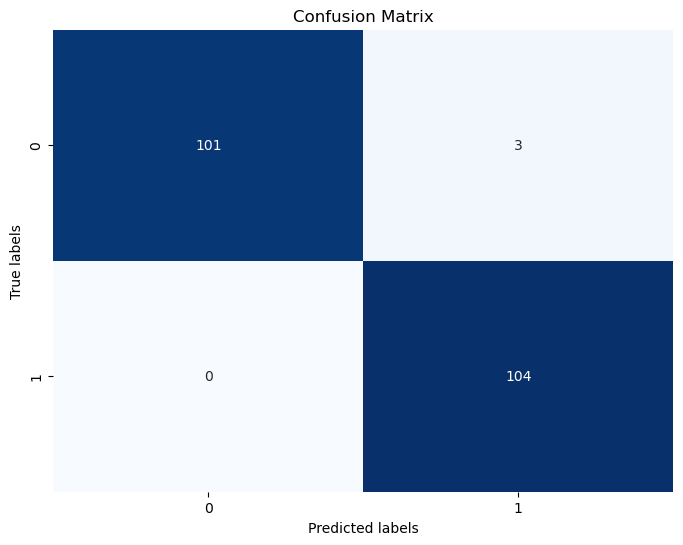

F1 Score: 0.985781990521327
Sensibilidad (Recall): 1.0
Especificidad: 0.9711538461538461
Exactitud: 0.9855769230769231


In [24]:
y_pred = model.predict(X_test)


conf_matrix = confusion_matrix(y_test, y_pred)

f1 = f1_score(y_test, y_pred)
sensibilidad = recall_score(y_test, y_pred)
exactitud = accuracy_score(y_test, y_pred)

TN, FP, FN, TP = conf_matrix.ravel()
especificidad = TN / (TN + FP)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, cmap="Blues", fmt="d", cbar=False)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

print("F1 Score:", f1)
print("Sensibilidad (Recall):", sensibilidad)
print("Especificidad:", especificidad)
print("Exactitud:", exactitud)

In [25]:
import joblib
joblib.dump(model, 'random_forest_model.pkl')

['random_forest_model.pkl']

### implementación del modelo

In [30]:
#Si desea implementarse, debe correr esta tambien
def preprocess_and_extrac_features(y, sr): #extraccion de caracteristicas por audio
    loudness = np.mean(librosa.amplitude_to_db(np.abs(y)))
    duration = librosa.get_duration(y=y, sr=sr)
    mfccs = np.mean(librosa.feature.mfcc(y=y, sr=sr).T, axis=0)
    spectral_energy = np.mean(librosa.feature.rms(y=y))
    zero_crossing_rate = np.mean(librosa.feature.zero_crossing_rate(y))
    spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
    spectral_bandwidth = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
    spectral_contrast = np.mean(librosa.feature.spectral_contrast(y=y, sr=sr))
    return [loudness, duration, spectral_energy, zero_crossing_rate, spectral_centroid, spectral_bandwidth, spectral_contrast] + mfccs.tolist()

In [ ]:
# Record Audio
# RECORDING

import pyaudio
import wave

chunk = 1024  # Record in chunks of 1024 samples
sample_format = pyaudio.paInt16  # 16 bits per sample
channels = 1
fs = 44100  # Record at 44100 samples per second
seconds = 3
filename = "output.wav"

p = pyaudio.PyAudio()  # Create an interface to PortAudio

print('Recording')

stream = p.open(format=sample_format,
                channels=channels,
                rate=fs,
                frames_per_buffer=chunk,
                input=True)

frames = []  # Initialize array to store frames

# Store data in chunks for 3 seconds
for i in range(0, int(fs / chunk * seconds)):
    data = stream.read(chunk)
    frames.append(data)

# Stop and close the stream 
stream.stop_stream()
stream.close()
# Terminate the PortAudio interface
p.terminate()

print('Finished recording')

# Save the recorded data as a WAV file
wf = wave.open(filename, 'wb')
wf.setnchannels(channels)
wf.setsampwidth(p.get_sample_size(sample_format))
wf.setframerate(fs)
wf.writeframes(b''.join(frames))
wf.close()

In [ ]:
def make_prediccion():
    rf_classifier = joblib.load('random_forest_model.pkl')
    y, sr = librosa.load("output.wav")
    result = preprocess_and_extrac_features(y, sr)
    df = pd.DataFrame([result], columns=['Loudness', 'Duration', 'Spectral Energy', 'Zero Crossing Rate', 'Spectral Centroid', 'Spectral Bandwidth',
                                             'Spectral Contrast'] + ['MFCC_' + str(i) for i in range(1, 21)])
    X = df[['Spectral Centroid', 'Spectral Bandwidth', 'MFCC_2', 'MFCC_5', 'MFCC_9', 'MFCC_11', 'MFCC_13', 'MFCC_17']]
    y_pred = rf_classifier.predict(X)
    if y_pred[0] == 0: print("ARTIFICIAL")
    else: print("REAL")

In [43]:
make_prediccion()

REAL
